In [1]:
import os
from glob import glob
import numpy as np
import dask
import xarray as xr
import cartopy.crs as ccrs
from cmocean import cm
import xgcm

from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = 20, 12

from mitequinox.utils import *

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/cmocean/tools.py:76: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not mpl.cbook.is_string_like(rgbin[0]):


In [2]:
from dask_jobqueue import PBSCluster
local_dir = os.getenv('TMPDIR')
cluster = PBSCluster(local_directory=local_dir)
#print(cluster.job_script())
w = cluster.start_workers(30)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/utils.py:128: RuntimeWarning: Couldn't detect a suitable IP address for reaching '8.8.8.8', defaulting to '127.0.0.1': [Errno 101] Network is unreachable
  % (host, default, e), RuntimeWarning)


In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [6]:
client

Client Scheduler: tcp://10.148.1.1:49830 Dashboard: http://10.148.1.1:8787/status,Cluster Workers: 60 Cores: 240 Memory: 3000.00 GB


_________
# Read dataset


In [38]:
Nf = 4
data_dir = '/home1/scratch/xyu/mit_nc_t/'


filenames_SSU = sorted(glob(data_dir+'SSU_*.nc'))
filenames_SSU = filenames_SSU[:Nf]
ds_SSU = xr.open_mfdataset(filenames_SSU, concat_dim='time', compat='equals')

filenames_SSV = sorted(glob(data_dir+'SSV_*.nc'))
filenames_SSV = filenames_SSV[:Nf]
ds_SSV = xr.open_mfdataset(filenames_SSV, concat_dim='time', compat='equals')


filenames_SST = sorted(glob(data_dir+'SST_*.nc'))
filenames_SST = filenames_SST[:Nf]
ds_SST = xr.open_mfdataset(filenames_SST, concat_dim='time', compat='equals')

filenames_SSS = sorted(glob(data_dir+'SSS_*.nc'))
filenames_SSS = filenames_SSS[:Nf]
ds_SSS = xr.open_mfdataset(filenames_SSS, concat_dim='time', compat='equals')

grid = xr.open_dataset('/home1/scratch/xyu/mit_grid.nc', decode_coords=True)


In [39]:
ds = xr.merge([ds_SSU, ds_SSV, ds_SST, ds_SSS, grid])
print(ds)

<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, time: 4)
Coordinates:
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06
    dtime    (time) datetime64[ns] dask.array<shape=(4,), chunksize=(1,)>
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    XG       (face, j_g, i_g) float32 ...
    YG       (face, j_g, i_g) float32 ...
    rA       (face, j, i) float32 ...
    dxG      (face, j_g, i) float32 ...
    dyG      (face, j, i_g) float32 ...
    Depth    (face, j, i) float32 ...
    rAz      (face, j_g, i_g) float32 ...
    dxC      (face, j, i_

In [9]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

---


# 1.1 Snapshot of SST

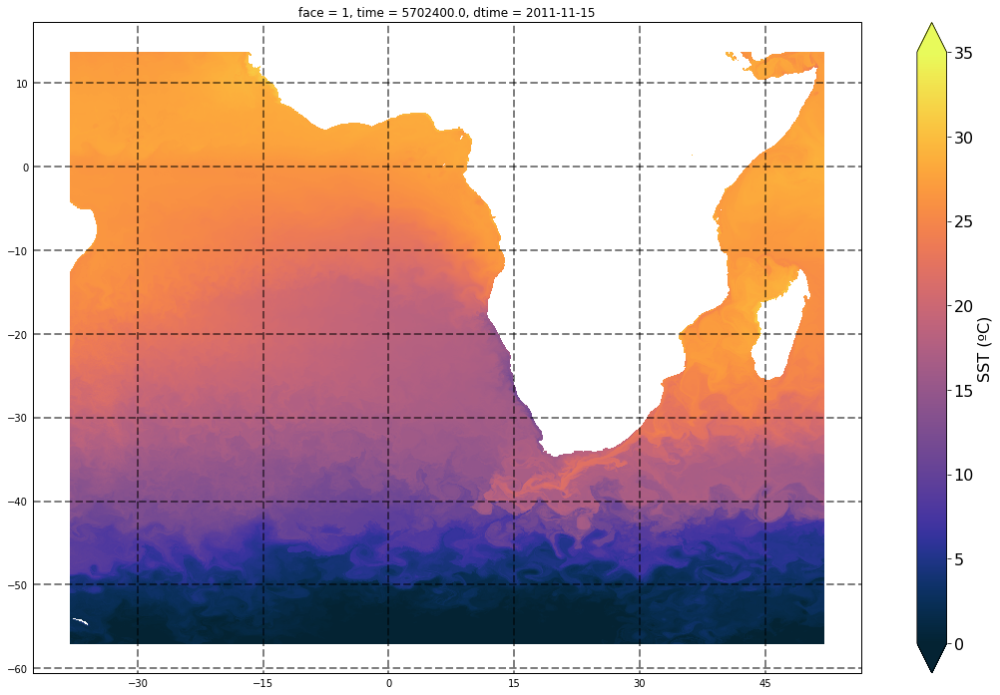

In [11]:
SST = ds['SST'].isel(face=1, time=0)

fig = plt.figure(figsize=(20,12))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

cax = SST.plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin=0, vmax=35, add_colorbar = False, cmap = cm.thermal)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False

plt.ylabel('Latitude',fontsize=16)
plt.xlabel('Longitude',fontsize=16)
ax.tick_params(labelsize=16)

cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=16)
cbar.set_label('SST (ºC)', fontsize=16)


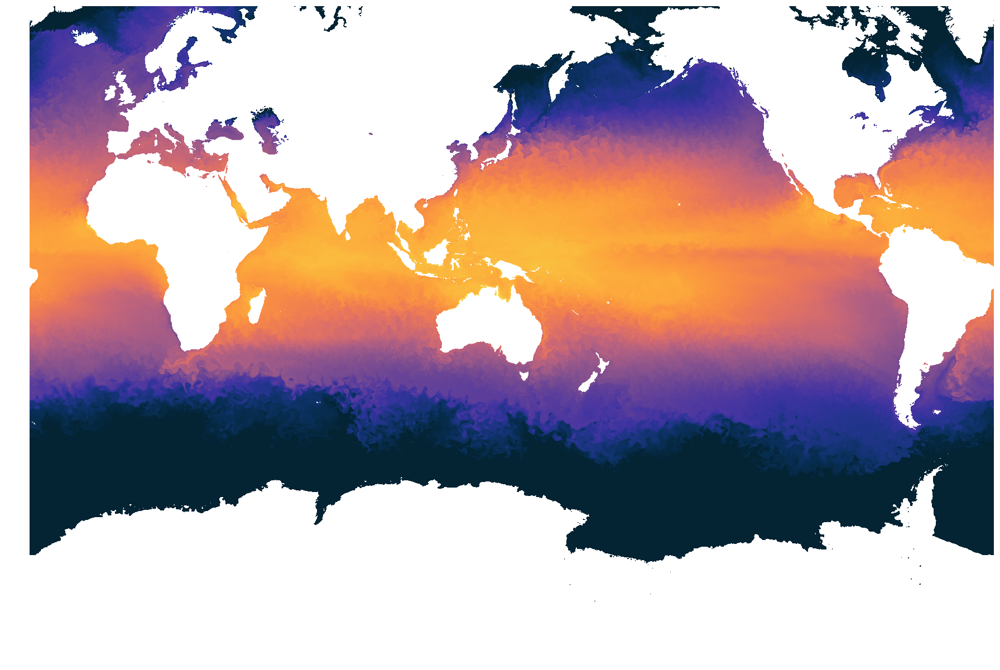

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.1:34348 remote=tcp://10.148.1.1:49830>


In [13]:
quick_llc_plot(ds['SST'].isel(time=0), vmin=0, vmax=35, add_colorbar=False, axis_off=True, cmap = cm.thermal)

# 1.2 face connections

In [14]:
face_connections = {'face': {0: {'X': ((12, 'Y', False), (3, 'X', False)),
                                 'Y': (None, (1, 'Y', False))},
                             1: {'X': ((11, 'Y', False), (4, 'X', False)),
                                 'Y': ((0, 'Y', False), (2, 'Y', False))},
                             2: {'X': ((10, 'Y', False), (5, 'X', False)),
                                 'Y': ((1, 'Y', False), (6, 'X', False))},
                             3: {'X': ((0, 'X', False), (9, 'Y', False)),
                                 'Y': (None, (4, 'Y', False))},
                             4: {'X': ((1, 'X', False), (8, 'Y', False)),
                                 'Y': ((3, 'Y', False), (5, 'Y', False))},
                             5: {'X': ((2, 'X', False), (7, 'Y', False)),
                                 'Y': ((4, 'Y', False), (6, 'Y', False))},
                             6: {'X': ((2, 'Y', False), (7, 'X', False)),
                                 'Y': ((5, 'Y', False), (10, 'X', False))},
                             7: {'X': ((6, 'X', False), (8, 'X', False)),
                                 'Y': ((5, 'X', False), (10, 'Y', False))},
                             8: {'X': ((7, 'X', False), (9, 'X', False)),
                                 'Y': ((4, 'X', False), (11, 'Y', False))},
                             9: {'X': ((8, 'X', False), None),
                                 'Y': ((3, 'X', False), (12, 'Y', False))},
                             10: {'X': ((6, 'Y', False), (11, 'X', False)),
                                  'Y': ((7, 'Y', False), (2, 'X', False))},
                             11: {'X': ((10, 'X', False), (12, 'X', False)),
                                  'Y': ((8, 'Y', False), (1, 'X', False))},
                             12: {'X': ((11, 'X', False), None),
                                  'Y': ((9, 'Y', False), (0, 'X', False))}}}

In [15]:
x_grid = xgcm.Grid(ds, face_connections=face_connections)
print(x_grid)

<xgcm.Grid>
Y Axis (periodic):
  * center   j (4320) --> left
  * left     j_g (4320) --> center
X Axis (periodic):
  * center   i (4320) --> left
  * left     i_g (4320) --> center


In [51]:
#import xgcm
grid = xgcm.Grid(ds, periodic=['X', 'Y'])
grid

<xgcm.Grid>
Y Axis (periodic):
  * center   j (4320) --> left
  * left     j_g (4320) --> center
X Axis (periodic):
  * center   i (4320) --> left
  * left     i_g (4320) --> center

# 1.3 Gradient of SST (i.e. dsst/dx and dsst/dy)

In [33]:
dsst_dx = (x_grid.diff(ds['SST'],'X', boundary='none'))/ds.dxC
print(dsst_dx)

<xarray.DataArray (time: 4, face: 13, j: 4320, i_g: 4320)>
dask.array<shape=(4, 13, 4320, 4320), dtype=float32, chunksize=(1, 1, 4320, 1)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    dyG      (face, j, i_g) float32 ...
    dxC      (face, j, i_g) float32 ...
    rAw      (face, j, i_g) float32 ...


In [40]:
u_dsst_dx = dsst_dx * ds['SSU']
print(u_dsst_dx)

<xarray.DataArray (time: 4, face: 13, j: 4320, i_g: 4320)>
dask.array<shape=(4, 13, 4320, 4320), dtype=float32, chunksize=(1, 1, 4320, 1)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    dyG      (face, j, i_g) float32 478.96072 478.9889 479.01703 479.0451 ...
    dxC      (face, j, i_g) float32 324.6357 324.63788 324.64 324.64215 ...
    rAw      (face, j, i_g) float32 155487.83 155497.98 155508.08 155518.31 ...
    dtime    (time) datetime64[ns] dask.array<shape=(4,), chunksize=(1,)>


In [53]:
u_dsst_dx_i = grid.interp(u_dsst_dx,'X')
print(u_dsst_dx_i)

<xarray.DataArray 'mul-55f84e9947f9623714da38ea1815839d' (time: 4, face: 13, j: 4320, i: 4320)>
dask.array<shape=(4, 13, 4320, 4320), dtype=float32, chunksize=(1, 1, 4320, 1)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...


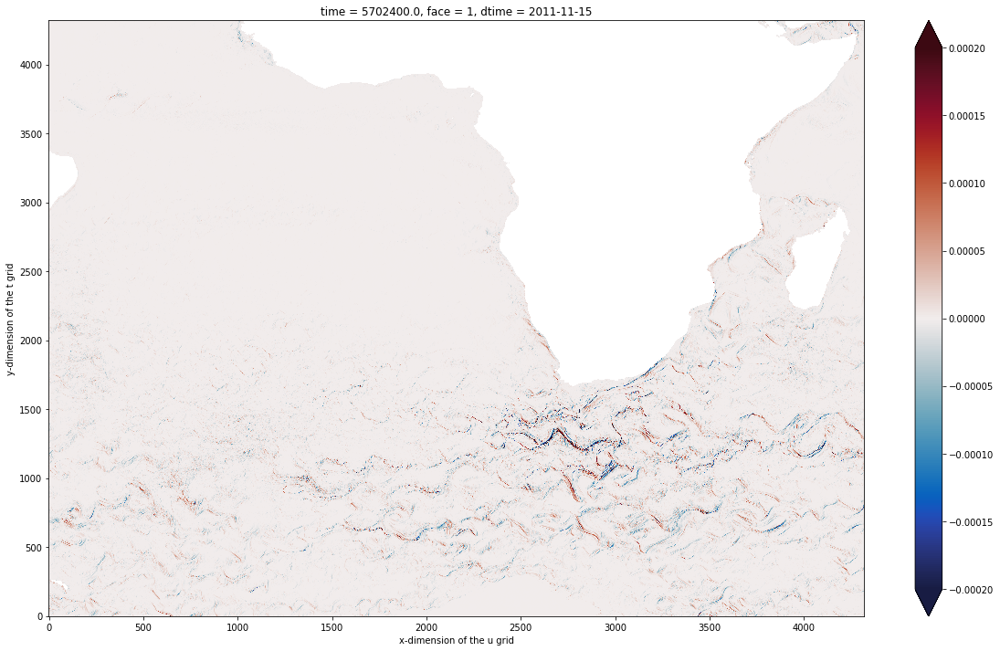

In [41]:
fig = plt.figure(figsize=(20,12))
u_dsst_dx.isel(time=0,face=1).plot(vmin=-0.0002, vmax=0.0002, cmap=cm.balance)

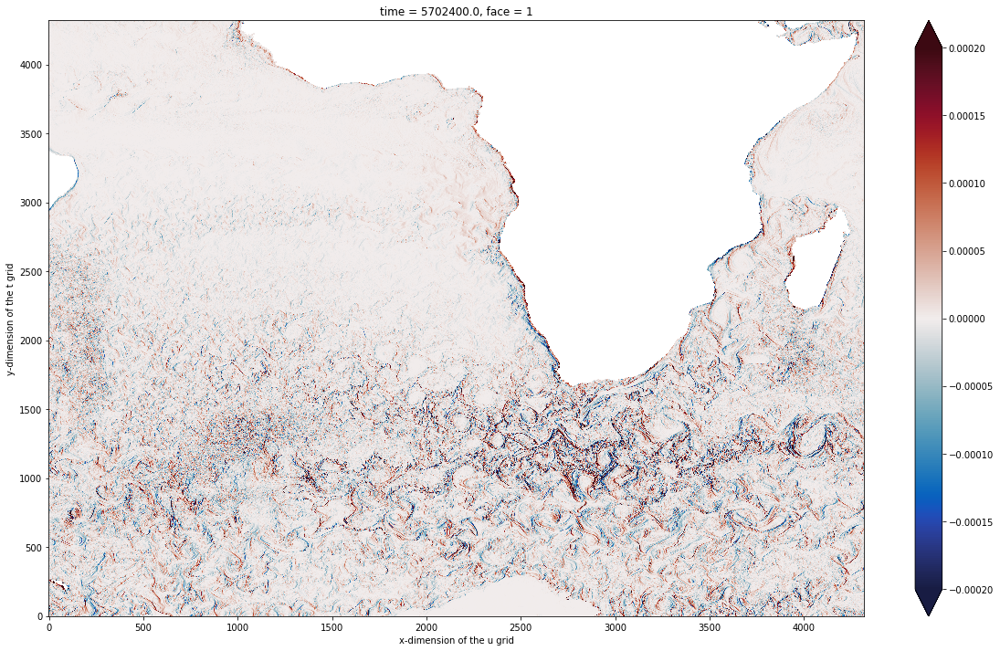

In [29]:
fig = plt.figure(figsize=(20,12))
dsst_dx.isel(time=0,face=1).plot(vmin=-0.0002, vmax=0.0002, cmap=cm.balance)

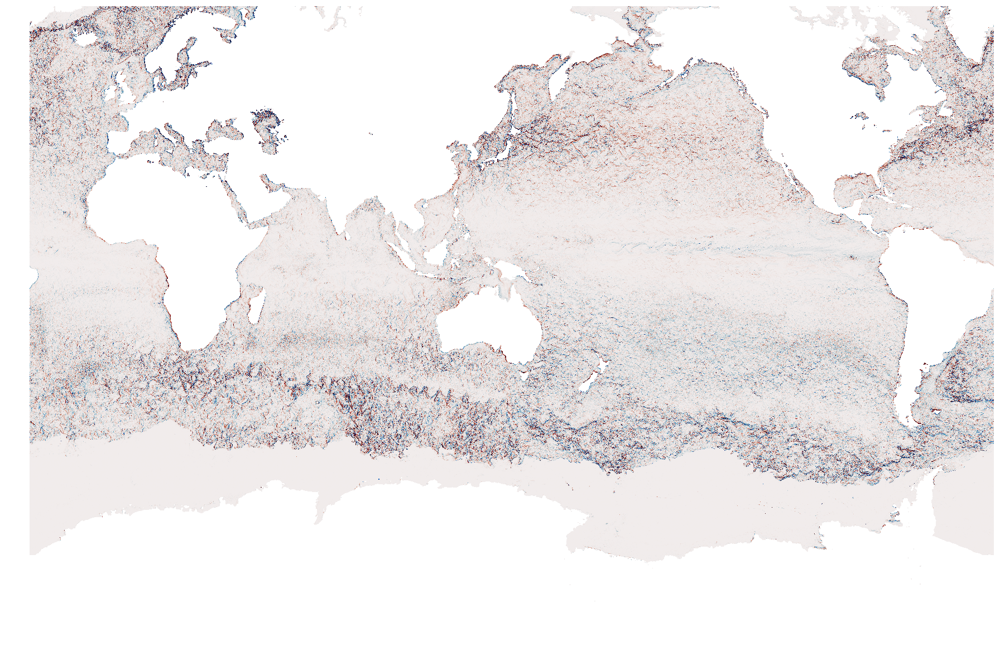

In [34]:
quick_llc_plot(dsst_dx.isel(time=0), vmin=-0.0002, vmax=0.0002, cmap=cm.balance, add_colorbar=False, axis_off=True)

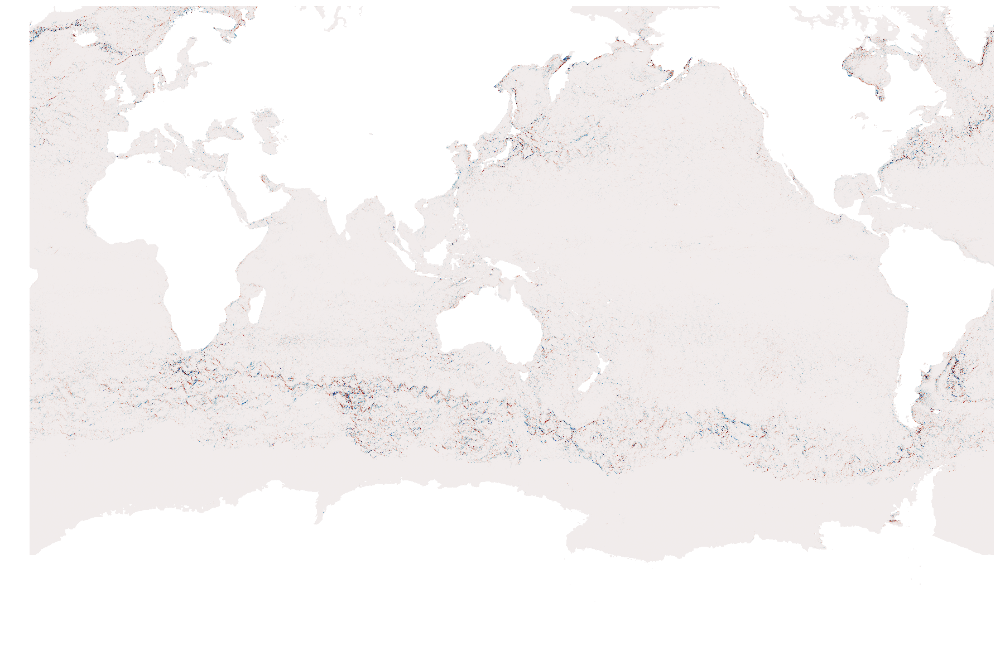

In [42]:
quick_llc_plot(u_dsst_dx.isel(time=0), vmin=-0.0002, vmax=0.0002, cmap=cm.balance, add_colorbar=False, axis_off=True)

In [31]:
dsst_dy = (x_grid.diff(ds['SST'],'Y', boundary='extend'))/ds.dyC
print(dsst_dy)

<xarray.DataArray (time: 4, face: 13, j_g: 4320, i: 4320)>
dask.array<shape=(4, 13, 4320, 4320), dtype=float32, chunksize=(1, 1, 1, 4320)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    dxG      (face, j_g, i) float32 ...
    dyC      (face, j_g, i) float32 ...
    rAs      (face, j_g, i) float32 ...


In [48]:
v_dsst_dy = dsst_dy * ds['SSV']
print(v_dsst_dy)

<xarray.DataArray (time: 4, face: 13, j_g: 4320, i: 4320)>
dask.array<shape=(4, 13, 4320, 4320), dtype=float32, chunksize=(1, 1, 1, 4320)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    dxG      (face, j_g, i) float32 324.63684 324.639 324.64114 324.64328 ...
    dyC      (face, j_g, i) float32 239.48717 239.50125 239.51529 239.52933 ...
    rAs      (face, j_g, i) float32 77743.875 77748.9 77753.945 77759.03 ...
    dtime    (time) datetime64[ns] dask.array<shape=(4,), chunksize=(1,)>


In [52]:
v_dsst_dy_j = grid.interp(v_dsst_dy,'Y')
print(v_dsst_dy_j)

<xarray.DataArray 'mul-cb3d9a4c0fda4c729b157aca12227d89' (time: 4, face: 13, j: 4320, i: 4320)>
dask.array<shape=(4, 13, 4320, 4320), dtype=float32, chunksize=(1, 1, 1, 4320)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...


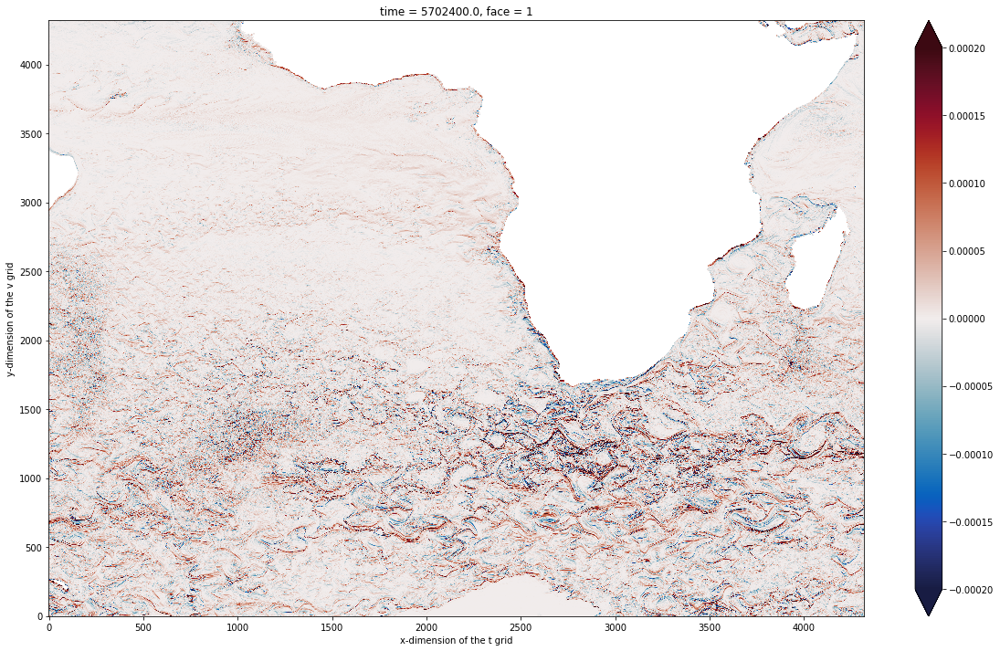

In [32]:
fig = plt.figure(figsize=(20,12))
dsst_dy.isel(time=0,face=1).plot(vmin=-0.0002, vmax=0.0002, cmap=cm.balance)

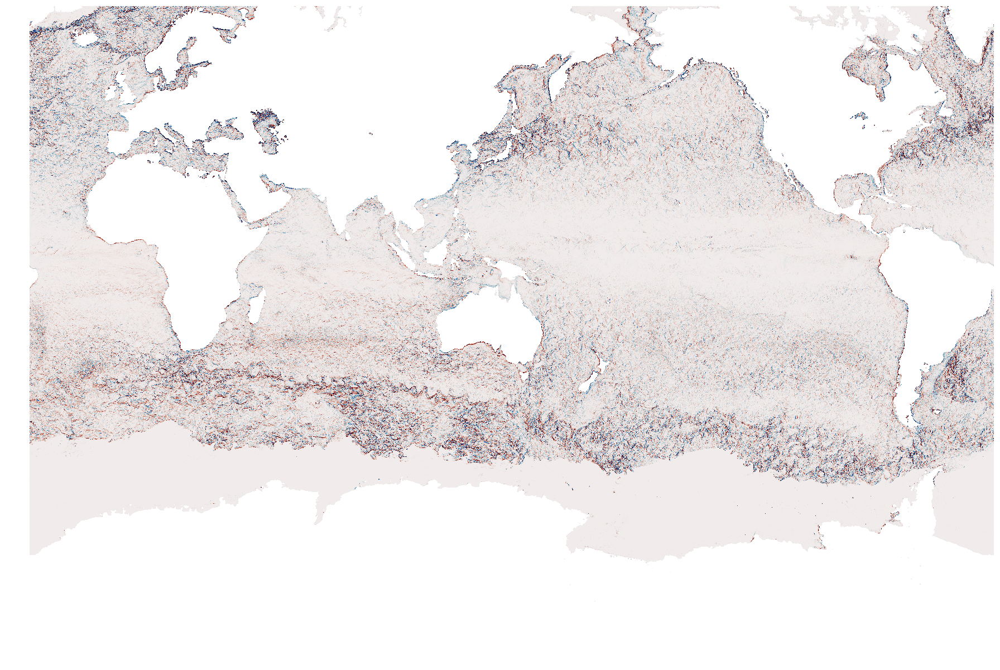

In [35]:
quick_llc_plot(dsst_dy.isel(time=0), vmin=-0.0002, vmax=0.0002, cmap=cm.balance, add_colorbar=False, axis_off=True)

# 3. Time derivative of SST

A central difference is applied to compute du/dt.

In [47]:
SST_time2 = ds['SST'].isel(time=2)
print(SST_time2)

<xarray.DataArray 'SST' (face: 13, j: 4320, i: 4320)>
dask.array<shape=(13, 4320, 4320), dtype=float32, chunksize=(13, 4320, 4320)>
Coordinates:
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    time     float64 5.71e+06
    dtime    datetime64[ns] dask.array<shape=(), chunksize=()>
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    rA       (face, j, i) float32 ...
    Depth    (face, j, i) float32 ...


In [24]:
SST_time0 = ds['SST'].isel(time=0)
print(SST_time0)

<xarray.DataArray 'SST' (face: 13, j: 4320, i: 4320)>
dask.array<shape=(13, 4320, 4320), dtype=float32, chunksize=(13, 4320, 4320)>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    time     float64 5.702e+06
    dtime    datetime64[ns] dask.array<shape=(), chunksize=()>
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    rA       (face, j, i) float32 ...
    Depth    (face, j, i) float32 ...


In [25]:
d_SST_dt_time1 = (SST_time2 - SST_time0)/2/3600
print(d_SST_dt_time1)

<xarray.DataArray 'SST' (face: 13, j: 4320, i: 4320)>
dask.array<shape=(13, 4320, 4320), dtype=float32, chunksize=(13, 4320, 4320)>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    XC       (face, j, i) float32 -114.93228 -114.93217 -114.93205 ...
    YC       (face, j, i) float32 -88.17715 -88.18007 -88.18299 -88.185905 ...
    rA       (face, j, i) float32 155492.97 155503.03 155513.17 155523.31 ...
    Depth    (face, j, i) float32 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...


In [26]:
d_SST_dt_time1_face1 = d_SST_dt_time1.isel(face=1)
print(d_SST_dt_time1_face1)

<xarray.DataArray 'SST' (j: 4320, i: 4320)>
dask.array<shape=(4320, 4320), dtype=float32, chunksize=(4320, 4320)>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    face     int64 1
    XC       (j, i) float32 -37.989582 -37.96875 -37.947918 -37.927082 ...
    YC       (j, i) float32 -57.001026 -57.001026 -57.001026 -57.001026 ...
    rA       (j, i) float32 1552802.6 1552802.6 1552802.6 1552802.5 ...
    Depth    (j, i) float32 3047.2024 3032.884 3033.7307 3074.5486 3129.34 ...


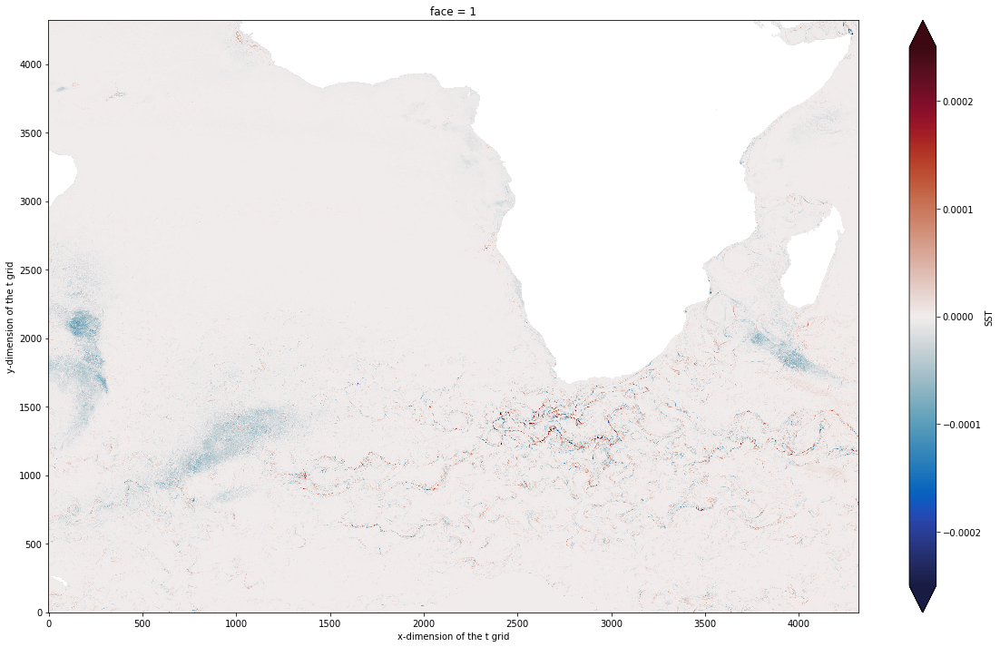

In [28]:
fig = plt.figure(figsize=(20,12))
d_SST_dt_time1_face1.plot(vmin=-0.00025, vmax=0.00025, cmap = cm.balance)

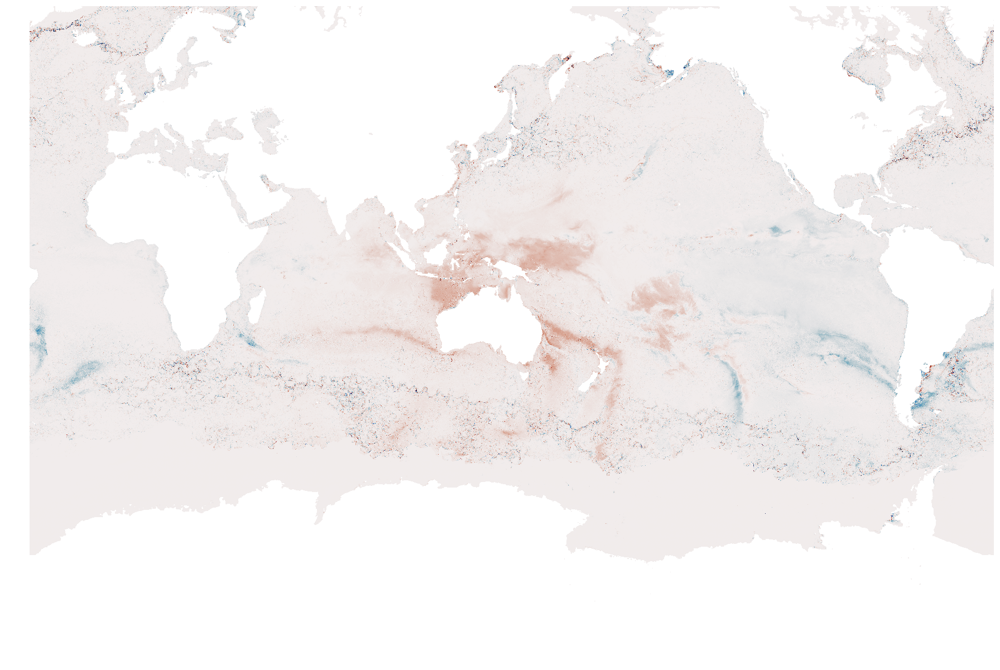

In [37]:
quick_llc_plot(d_SST_dt_time1, vmin=-0.0002, vmax=0.0002, cmap=cm.balance, add_colorbar=False, axis_off=True)

In [59]:
print(u_dsst_dx_i)

<xarray.DataArray 'mul-55f84e9947f9623714da38ea1815839d' (time: 4, face: 13, j: 4320, i: 4320)>
dask.array<shape=(4, 13, 4320, 4320), dtype=float32, chunksize=(1, 1, 4320, 1)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...


In [55]:
print(v_dsst_dy_j)

<xarray.DataArray 'mul-cb3d9a4c0fda4c729b157aca12227d89' (time: 4, face: 13, j: 4320, i: 4320)>
dask.array<shape=(4, 13, 4320, 4320), dtype=float32, chunksize=(1, 1, 1, 4320)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...


In [56]:
print(d_SST_dt_time1)

<xarray.DataArray 'SST' (face: 13, j: 4320, i: 4320)>
dask.array<shape=(13, 4320, 4320), dtype=float32, chunksize=(13, 4320, 4320)>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    XC       (face, j, i) float32 -114.93228 -114.93217 -114.93205 ...
    YC       (face, j, i) float32 -88.17715 -88.18007 -88.18299 -88.185905 ...
    rA       (face, j, i) float32 155492.97 155503.03 155513.17 155523.31 ...
    Depth    (face, j, i) float32 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...


In [60]:
u_dsst_dx_i_time1 = u_dsst_dx_i.isel(time=1)
print(u_dsst_dx_i)

<xarray.DataArray 'mul-55f84e9947f9623714da38ea1815839d' (time: 4, face: 13, j: 4320, i: 4320)>
dask.array<shape=(4, 13, 4320, 4320), dtype=float32, chunksize=(1, 1, 4320, 1)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...


In [62]:
residual_sst = (d_SST_dt_time1 + u_dsst_dx_i.isel(time=1) + v_dsst_dy_j.isel(time=1)).load()
print(residual_sst)

<xarray.DataArray (face: 13, j: 4320, i: 4320)>
array([[[          nan,           nan, ...,           nan,           nan],
        [          nan,           nan, ...,           nan,           nan],
        ...,
        [-8.150025e-07, -2.554584e-07, ..., -5.187742e-06, -5.894702e-06],
        [          nan,           nan, ...,           nan,           nan]],

       [[ 9.888975e-07,  4.707924e-07, ...,  8.545805e-07,  3.197893e-07],
        [ 1.474797e-06, -1.350093e-07, ...,  6.460501e-06,  4.573819e-06],
        ...,
        [-1.394956e-06, -1.165976e-06, ..., -2.658723e-06,  2.478178e-07],
        [-3.242502e-06, -2.472152e-06, ..., -3.632347e-06, -2.064415e-06]],

       ...,

       [[-5.576569e-06, -4.923064e-06, ..., -1.384158e-05, -1.340407e-05],
        [-5.393557e-06, -5.528860e-06, ..., -1.476433e-05, -1.206557e-05],
        ...,
        [-1.433690e-06, -1.517268e-06, ..., -3.904055e-06, -1.241566e-06],
        [-2.412872e-06, -1.779217e-06, ..., -3.741177e-06, -6.766104e-0

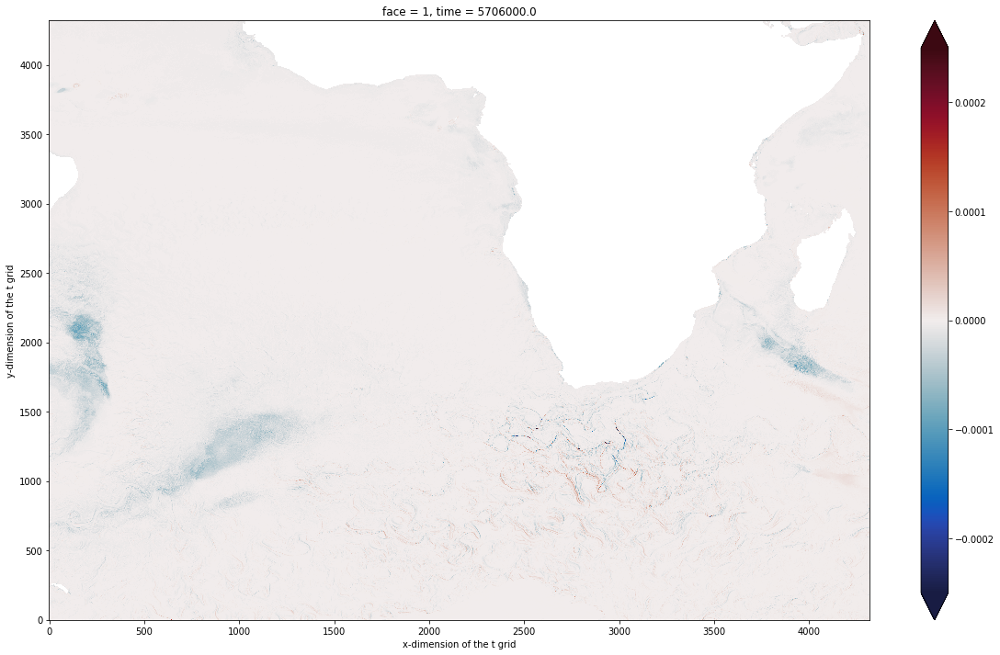

In [63]:
fig = plt.figure(figsize=(20,12))
residual_sst.isel(face=1).plot(vmin=-0.00025, vmax=0.00025, cmap = cm.balance)

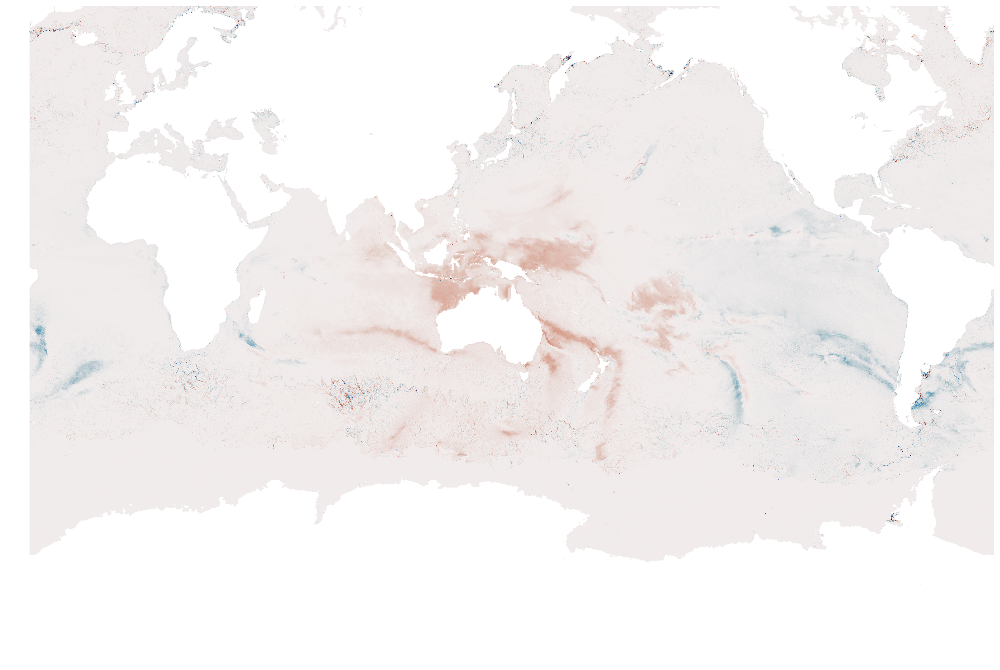

In [64]:
quick_llc_plot(residual_sst, vmin=-0.0002, vmax=0.0002, cmap=cm.balance, add_colorbar=False, axis_off=True)

In [66]:
cluster.scheduler.close()

<Future finished result=None>